In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.insert(0, '../')
import rhkpy

import matplotlib.pyplot as pl
import numpy as np
import xarray as xr
import hvplot.xarray
import holoviews as hv
import panel as pn

# Plotting tests

## `qplot()` testing

In [3]:
fpath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\ABC\STM\stacking faults\FLG25(9) - 6 layer' + '\\'
m = rhkpy.rhkdata(fpath + 'MK_ABC_FLG_25_9K_2023_07_24_17_51_20_911.sm4')

In [4]:
m_abs = m.coord_to_absolute()

In [249]:
m.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='bias', options=OrderedDict([('-0.627', ...]), value=-0.627000059466809, width=250)

In [4]:
filename_izmap = 'Iz_map_Stripes-9K-HOPG-SPI2-3_2021_09_08_11_21_03_743.sm4'
izmap = rhkpy.rhkdata(filename_izmap)

In [28]:
izmap_abs = izmap.coord_to_absolute()

In [34]:
iz_topo = izmap_abs.image.topography[:, :, 0].hvplot(x = 'x', y = 'y', cmap = 'viridis')
temp = izmap.spectra.drop(['z', 'repetitions', 'zscandir']).drop_vars(['current'])
iz_specpos = temp.hvplot.scatter(x = 'x', y = 'y', marker = 'x', groupby = [])

In [35]:
iz_topo * iz_specpos

:Overlay
   .Image.I   :Image   [x,y]   (topography)
   .Scatter.I :Scatter   [x]   (y)

In [250]:
izmap_abs.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='z', options=OrderedDict([('0', ...]), value=0.0, width=250)

In [5]:
datapath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\cikkek - published\2022\RG magnetism\figures\splitting' + '\\'
filename_map209 = '9K_ABC6_2020_11_02_08_47_19_209.sm4'
map209 = rhkpy.rhkdata(datapath + filename_map209)

In [86]:
map209_plot = map209.qplot()
map209_plot

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] HoloViews(DynamicMap, sizing_mode='fixed')
        [1] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='bias', options=OrderedDict([('-0.2', ...]), value=-0.20000001601874828, width=250)

In [251]:
map209._qplot_topo(cmap_topo = 'Blues_r')

:Image   [x,y]   (topography)

In [96]:
map209._qplot_lia()

:Image   [x,y]   (lia)

In [95]:
map209._qplot_map_iv()

:DynamicMap   [bias]
   :Image   [specpos_x,specpos_y]   (lia)

Plot the spectrum positions in hvplot

In [36]:
temp = map209.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])

In [38]:
temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], aspect = 1, color = 'red', marker = 'dot')

:Scatter   [x]   (y)

In [6]:
filename = 'line_9K_ABC6_2020_11_01_12_12_27_213.sm4'
linespec = rhkpy.rhkdata(filename)

In [87]:
lineiv_plot = linespec.qplot()
lineiv_plot

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='dist', options=OrderedDict([('0', ...]), value=0.0, width=250)
        [1] HoloViews(DynamicMap, height=300, sizing_mode='fixed', width=700)

In [88]:
linespec._qplot_line_iv(cmap_spec = 'RdBu_r')

:Image   [bias,dist]   (lia)

In [89]:
linespec._qplot_line_spec_iv()

:DynamicMap   [dist]
   :Overlay
      .Curve.Left  :Curve   [bias]   (lia)
      .Curve.Right :Curve   [bias]   (lia)

In [7]:
izline_filename = 'Iz_line_Stripes-9K-HOPG-SPI2-3_2021_09_02_15_15_35_930.sm4'
izline = rhkpy.rhkdata(izline_filename)

In [90]:
izline_plot = izline.qplot()
izline_plot

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] Column
        [0] WidgetBox(align=('end', 'start'))
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='dist', options=OrderedDict([('0', ...]), value=0.0, width=250)
        [1] HoloViews(DynamicMap, height=300, sizing_mode='fixed', width=700)

In [91]:
izline._qplot_line_spec_iz()

:DynamicMap   [dist]
   :Overlay
      .Curve.I        :Curve   [z]   (current)
      .Curve.II       :Curve   [z]   (current)
      .Curve.III      :Curve   [z]   (current)
      .Curve.IV       :Curve   [z]   (current)
      .Curve.V        :Curve   [z]   (current)
      .Curve.VI       :Curve   [z]   (current)
      .Curve.VII      :Curve   [z]   (current)
      .Curve.VIII     :Curve   [z]   (current)
      .Curve.IX       :Curve   [z]   (current)
      .Curve.X        :Curve   [z]   (current)
      .Curve.Avg_up   :Curve   [z]   (current)
      .Curve.XI       :Curve   [z]   (current)
      .Curve.XII      :Curve   [z]   (current)
      .Curve.XIII     :Curve   [z]   (current)
      .Curve.XIV      :Curve   [z]   (current)
      .Curve.XV       :Curve   [z]   (current)
      .Curve.XVI      :Curve   [z]   (current)
      .Curve.XVII     :Curve   [z]   (current)
      .Curve.XVIII    :Curve   [z]   (current)
      .Curve.XIX      :Curve   [z]   (current)
      .Curve.XX       :Curve   [z]   (current)
      .Curve.Avg_down :Curve   [z]   (current)

In [8]:
filename_singlespec = 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4'
spec = rhkpy.rhkdata(filename_singlespec)

In [92]:
spec_plot = spec.qplot()
spec_plot

Row
    [0] HoloViews(Overlay, height=300, sizing_mode='fixed', width=400)
    [1] HoloViews(Overlay, height=300, sizing_mode='fixed', width=400)

In [34]:
spec_plot.save('test.png')

In [9]:
iz_single_filename = 'Iz_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_15_28_529.sm4'
izspec = rhkpy.rhkdata(iz_single_filename)

In [93]:
izspec.qplot()

HoloViews(Overlay, height=300, sizing_mode='fixed', width=400)

In [10]:
topo_lia = rhkpy.rhkdata('lia_image_ABC_Graphite-Sample5_9K_2021_08_17_23_02_19_872.sm4')

In [94]:
topo_lia.qplot()

Row
    [0] HoloViews(Image, sizing_mode='fixed')
    [1] HoloViews(Image, sizing_mode='fixed')

## testing thumbnail generation

In [ ]:
# rhkpy.genthumbs()

# Navigator

In [11]:
datapath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\cikkek - published\2022\RG magnetism\figures\splitting' + '\\'
filename_map209 = '9K_ABC6_2020_11_02_08_47_19_209.sm4'
map209 = rhkpy.rhkdata(datapath + filename_map209)
filename = 'line_9K_ABC6_2020_11_01_12_12_27_213.sm4'
linespec = rhkpy.rhkdata(filename)
filename_singlespec = 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4'
spec = rhkpy.rhkdata(filename_singlespec)

In [41]:
map209_abs = map209.coord_to_absolute()
map_topo_plot = map209_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone', label = 'topo file')

In [42]:
map_specpos = map209.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map_specpos_plot = map_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', aspect = 'equal', marker = 'x', color = 'blue', label = 'mapspec positions')

In [43]:
map_topo_plot * map_specpos_plot

:Overlay
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)

In [44]:
temp = linespec.spectra.drop_vars(['lia', 'current']).drop(['biasscandir', 'repetitions', 'bias'])
line_specpos_plot = temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', color = 'blue', aspect = 'equal', label = 'linespec')

In [45]:
map_topo_plot * line_specpos_plot

:Overlay
   .Image.Topo_file  :Image   [x,y]   (topography)
   .Scatter.Linespec :Scatter   [x]   (y)

In [46]:
spec.spectra

<xarray.Dataset>
Dimensions:      (bias: 481, repetitions: 3, biasscandir: 2)
Coordinates:
  * bias         (bias) float64 0.6 0.5975 0.595 0.5925 ... -0.595 -0.5975 -0.6
  * repetitions  (repetitions) int32 0 1 2
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, repetitions, biasscandir) float64 1.446 1.554 ... 0.9922
    current      (bias, repetitions, biasscandir) float64 44.3 49.2 ... -35.42
    x            float64 -97.14
    y            float64 -73.08
Attributes: (12/18)
    filename:           dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4
    speccoord_x:        -97.14440096786348
    speccoord_y:        -73.07891536356692
    speccoord_x units:  nm
    speccoord_y units:  nm
    bias:               0.59999996
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1266.9999999999998
    LI frequency unit:  Hz
    LI phase:           -104.9999999
    datatype:           spec
    spectype:           iv

In [47]:
spec_pos_plot = spec.spectra.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', color = 'blue', aspect = 1, label = 'single spec')
spec_pos_plot

:Scatter   [x]   (y)

In [48]:
map_topo_plot * line_specpos_plot * spec_pos_plot

:Overlay
   .Image.Topo_file     :Image   [x,y]   (topography)
   .Scatter.Linespec    :Scatter   [x]   (y)
   .Scatter.Single_spec :Scatter   [x]   (y)

Load some data where there is overlap

In [13]:
folder = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\ABC\STM\stacking faults\FLG25(9) - 6 layer' + '\\'
map238 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238.sm4')
line934 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_08_01_20_29_23_934.sm4')

In [22]:
map238_abs = map238.coord_to_absolute()
map238_topo_plot = map238_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone', label = 'topo file')
map238_specpos = map238.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map238_specpos_plot = map238_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', marker = 'x', label = 'mapspec positions')

In [25]:
map238.spectra

<xarray.Dataset>
Dimensions:      (bias: 321, specpos_y: 32, specpos_x: 32, repetitions: 1,
                  biasscandir: 2)
Coordinates:
  * bias         (bias) float64 0.6 0.5963 0.5925 ... -0.5925 -0.5962 -0.6
  * specpos_x    (specpos_x) float64 88.27 82.02 75.77 ... -92.98 -99.23 -105.5
  * specpos_y    (specpos_y) float64 710.2 703.9 697.7 ... 528.9 522.7 516.4
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    current      (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    x            (specpos_y, specpos_x) float64 88.27 82.02 ... -99.23 -105.5
    y            (specpos_y, specpos_x) float64 710.2 710.2 ... 516.4 516.4
Attributes: (12/15)
    filename:           MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238.sm4
    bias:               0.4999996
    bias units:         V
    setpoint:           99.99999439624929
    setpoint units:     pA
    measurement date:   07/31/23
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1372.0
    LI frequency unit:  Hz
    LI phase:           -105.9999999
    datatype:           map
    spectype:           iv

In [23]:
temp = line934.spectra.drop_vars(['lia', 'current']).drop(['biasscandir', 'repetitions', 'bias'])
line_specpos_plot = temp.hvplot.scatter(x = 'x', y = 'y', groupby = [], marker = 'x', label = 'linespec')

In [24]:
combined_plot = map238_topo_plot * line_specpos_plot * map238_specpos_plot
combined_plot.opts(aspect = 'equal', frame_width = 300, frame_height = 300)

:Overlay
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Linespec          :Scatter   [x]   (y)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)

This is a zoomed out map

In [53]:
map306 = rhkpy.rhkdata(folder + 'MK_ABC_FLG_25_9K_2023_07_27_08_11_22_306.sm4')

In [82]:
map306_abs = map306.coord_to_absolute()
map306_topo_plot = map306_abs.image.topography[:, :, 0].hvplot.image(x = 'x', cmap = 'bone')
map306_specpos = map306.spectra.drop(['bias', 'repetitions', 'biasscandir']).drop_vars(['lia', 'current'])
map306_specpos_plot = map306_specpos.hvplot.scatter(x = 'specpos_x', y = 'specpos_y', marker = 'x', label = 'mapspec positions')

Let's plot some lines around the topography

In [83]:
l_top = map306_abs.image.topography.drop('scandir')[-1, :].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue', label = 'topo file large')
l_bottom = map306_abs.image.topography.drop('scandir')[0, :].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')
l_left = map306_abs.image.topography.drop('scandir')[:, 0].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')
l_right = map306_abs.image.topography.drop('scandir')[:, -1].hvplot.line(x = 'x', y = 'y', aspect = 1, color = 'blue')

In [84]:
bounding_box = l_bottom * l_left * l_right * l_top

In [138]:
combined = map306_topo_plot * map238_topo_plot * line_specpos_plot * map306_specpos_plot * bounding_box
combined.opts(aspect = 'equal', frame_width = 300, frame_height = 300)

:Overlay
   .Image.I                   :Image   [x,y]   (topography)
   .Image.Topo_file           :Image   [x,y]   (topography)
   .Scatter.Linespec          :Scatter   [x]   (y)
   .Scatter.Mapspec_positions :Scatter   [specpos_x]   (specpos_y,x)
   .Curve.I                   :Curve   [x]   (y)
   .Curve.II                  :Curve   [x]   (y)
   .Curve.III                 :Curve   [x]   (y)
   .Curve.Topo_file_large     :Curve   [x]   (y)

In [46]:
izsingle = rhkpy.rhkdata("Iz_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_15_28_529.sm4")

In [138]:
rhkpy.navigation(map209, map238, line934, izline, topo_lia, izsingle, spec, izmap)

:Overlay
   .Image.I                                                                                                                                                    :Image   [x,y]   (topography)
   .Curve.I                                                                                                                                                    :Curve   [x]   (y)
   .Curve.II                                                                                                                                                   :Curve   [x]   (y)
   .Curve.III                                                                                                                                                  :Curve   [x]   (y)
   .Curve.A_9K_ABC6_2020_11_02_08_47_19_209_full_stop_sm4                                                                                                      :Curve   [x]   (y)
   .Image.II                                                                                                                                                   :Image   [x,y]   (topography)
   .Curve.IV                                                                                                                                                   :Curve   [x]   (y)
   .Curve.V                                                                                                                                                    :Curve   [x]   (y)
   .Curve.VI                                                                                                                                                   :Curve   [x]   (y)
   .Curve.MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238_full_stop_sm4                                                                                               :Curve   [x]   (y)
   .Image.III                                                                                                                                                  :Image   [x,y]   (topography)
   .Curve.VII                                                                                                                                                  :Curve   [x]   (y)
   .Curve.VIII                                                                                                                                                 :Curve   [x]   (y)
   .Curve.IX                                                                                                                                                   :Curve   [x]   (y)
   .Curve.Lia_image_ABC_Graphite_hyphen_minus_Sample5_9K_2021_08_17_23_02_19_872_full_stop_sm4                                                                 :Curve   [x]   (y)
   .Image.IV                                                                                                                                                   :Image   [x,y]   (topography)
   .Curve.X                                                                                                                                                    :Curve   [x]   (y)
   .Curve.XI                                                                                                                                                   :Curve   [x]   (y)
   .Curve.XII                                                                                                                                                  :Curve   [x]   (y)
   .Curve.Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4                              :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_9K_ABC6_2020_11_02_08_47_19_209_full_stop_sm4                                                                                       :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_25_9K_2023_08_01_11_03_22_238_full_stop_sm4                                                                              :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_

In [70]:
spec.spectra.attrs

{'filename': 'dI-dV_Stripes-9K-HOPG-SPI2-3_2021_09_07_10_23_58_152.sm4',
 'speccoord_x': -97.14440096786348,
 'speccoord_y': -73.07891536356692,
 'speccoord_x units': 'nm',
 'speccoord_y units': 'nm',
 'bias': 0.59999996,
 'bias units': 'V',
 'setpoint': 39.999996370720936,
 'setpoint units': 'pA',
 'measurement date': '09/07/21',
 'measurement time': '10:19:42',
 'LI amplitude': 10.0,
 'LI amplitude unit': 'mV',
 'LI frequency': 1266.9999999999998,
 'LI frequency unit': 'Hz',
 'LI phase': -104.9999999,
 'datatype': 'spec',
 'spectype': 'iv'}

Testing with the data from Konrad

In [124]:
folderpath = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\30 fok kep + spektrum' + '\\'
spec1 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_14_16_826.sm4')
spec2 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_20_12_513.sm4')
spec3 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_21_55_854.sm4')
spec4 = rhkpy.rhkdata(folderpath + 'dI-dV_MK_ABC_FLG_26_9K_2023_05_19_11_24_00_507.sm4')
topo321 = rhkpy.rhkdata(folderpath + 'MK_ABC_FLG_26_9K_2023_05_19_11_11_33_321.sm4')
folderpath2 = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\30 fok dIdV terkep' + '\\'
map505 = rhkpy.rhkdata(folderpath2 + 'MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505.sm4')
folderpath3 = r'C:\Users\zrbyt\OneDrive - energia.mta.hu\Documents\work_MFA\RHK Test Python Code\0 fok dIdV terkepek' + '\\'
map217 = rhkpy.rhkdata(folderpath3 + 'MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217.sm4')

In [165]:
rhkpy.navigation(map217, map505, spec2, spec3, spec4)

:Overlay
   .Image.I                                                                                          :Image   [x,y]   (topography)
   .Curve.I                                                                                          :Curve   [x]   (y)
   .Curve.II                                                                                         :Curve   [x]   (y)
   .Curve.III                                                                                        :Curve   [x]   (y)
   .Curve.MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217_full_stop_sm4                                     :Curve   [x]   (y)
   .Image.II                                                                                         :Image   [x,y]   (topography)
   .Curve.IV                                                                                         :Curve   [x]   (y)
   .Curve.V                                                                                          :Curve   [x]   (y)
   .Curve.VI                                                                                         :Curve   [x]   (y)
   .Curve.MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4                                     :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_26_9K_2023_05_18_19_10_55_217_full_stop_sm4                    :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4                    :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_20_12_513_full_stop_sm4 :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_21_55_854_full_stop_sm4 :Scatter   [x]   (y)
   .Scatter.Spec_pos_colon_dI_hyphen_minus_dV_MK_ABC_FLG_26_9K_2023_05_19_11_24_00_507_full_stop_sm4 :Scatter   [x]   (y)

In [162]:
rhkpy.navigation(izmap)

:Overlay
   .Image.I                                                                                                                                        :Image   [x,y]   (topography)
   .Curve.I                                                                                                                                        :Curve   [x]   (y)
   .Curve.II                                                                                                                                       :Curve   [x]   (y)
   .Curve.III                                                                                                                                      :Curve   [x]   (y)
   .Curve.Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4                  :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_Iz_map_Stripes_hyphen_minus_9K_hyphen_minus_HOPG_hyphen_minus_SPI2_hyphen_minus_3_2021_09_08_11_21_03_743_full_stop_sm4 :Scatter   [x]   (y)

# Taking section along two points

In [168]:
map505.spectra

<xarray.Dataset>
Dimensions:      (bias: 161, specpos_y: 8, specpos_x: 8, repetitions: 1,
                  biasscandir: 2)
Coordinates:
  * bias         (bias) float64 1.0 0.9875 0.975 0.9625 ... -0.975 -0.9875 -1.0
  * specpos_x    (specpos_x) float64 -792.5 -803.3 -814.2 ... -857.5 -868.3
  * specpos_y    (specpos_y) float64 -738.7 -749.6 -760.4 ... -803.7 -814.5
  * repetitions  (repetitions) int32 0
  * biasscandir  (biasscandir) <U5 'left' 'right'
Data variables:
    lia          (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    current      (bias, specpos_y, specpos_x, repetitions, biasscandir) float64 ...
    x            (specpos_y, specpos_x) float64 -792.5 -803.3 ... -813.7 -824.6
    y            (specpos_y, specpos_x) float64 -738.7 -745.0 ... -852.0 -858.3
Attributes: (12/15)
    filename:           MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505.sm4
    bias:               0.4999989
    bias units:         V
    setpoint:           49.999997198124646
    setpoint units:     pA
    measurement date:   05/19/23
    ...                 ...
    LI amplitude unit:  mV
    LI frequency:       1372.0
    LI frequency unit:  Hz
    LI phase:           -102.9999998
    datatype:           map
    spectype:           iv

In [170]:
rhkpy.navigation(map505)

:Overlay
   .Image.I                                                                       :Image   [x,y]   (topography)
   .Curve.I                                                                       :Curve   [x]   (y)
   .Curve.II                                                                      :Curve   [x]   (y)
   .Curve.III                                                                     :Curve   [x]   (y)
   .Curve.MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4                  :Curve   [x]   (y)
   .Scatter.Spec_pos_colon_MK_ABC_FLG_26_9K_2023_05_19_12_12_06_505_full_stop_sm4 :Scatter   [x]   (y)

In [208]:
def create_and_plot_section(dataarray, coordinates1, coordinates2, num_points=100):
    # Create a linear space between the coordinates
    specpos_x_line = np.linspace(coordinates1[0], coordinates2[0], num_points)
    specpos_y_line = np.linspace(coordinates1[1], coordinates2[1], num_points)

    # Calculate the distance along the section
    dist = np.sqrt((specpos_x_line - specpos_x_line[0]) ** 2 + (specpos_y_line - specpos_y_line[0]) ** 2)

    # Interpolate the lia values along the line for all bias values
    lia_section = []
    for sx, sy in zip(specpos_x_line, specpos_y_line):
        lia_values = dataarray.interp(specpos_x=sx, specpos_y=sy, method='nearest')
        lia_section.append(lia_values.values)

    # Create a new DataArray with the lia values along the section
    new_dataarray = xr.DataArray(
        np.array(lia_section).T,
        dims=['bias', 'dist'],
        coords={'bias': dataarray['bias'], 'dist': dist}
    )

    # Plot the 2D lia data for the bias value closest to 0
    pl.figure(figsize=(10, 8))
    pl.pcolormesh(dataarray['specpos_x'], dataarray['specpos_y'], dataarray.sel(bias=0, method='nearest').T, shading='auto')
    pl.plot([coordinates1[0], coordinates2[0]], [coordinates1[1], coordinates2[1]], 'r-', lw=2)
    pl.colorbar(label='lia (pA)')
    pl.xlabel('Specpos X Coordinate')
    pl.ylabel('Specpos Y Coordinate')
    pl.title('2D Plot of lia Data with Section Line for bias Closest to 0')
    pl.show()

    return new_dataarray

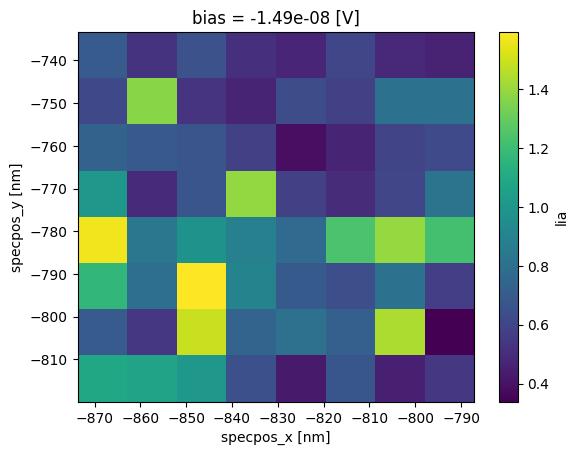

In [234]:
temp = map505.mrep().msw().spectra.lia.sel(bias = 0, method = 'nearest')
temp.plot()

In [235]:
# Calling the function with the diagonal coordinates
section_dataarray_result = create_and_plot_section(temp, [-860, -800], [-850, -750])

# Displaying the overview of the resulting DataArray
section_dataarray_result

ValueError: different number of dimensions on data and dims: 1 vs 2